In [143]:
import numpy as np
import pickle
import pylab
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import os
%matplotlib inline
saveFigPath = '/raid/linjieli/faceSimilarity/attractive/Result/configMeasure/'
if not os.path.exists(saveFigPath):
    os.makedirs(saveFigPath)
openPath = '/raid/linjieli/faceSimilarity/attractive/configData/data/'
    
datasetNum = 4
picNum = 50
subNum = 0
imWidth = 200
imHeight = 200
measureDataOrig = pd.DataFrame.from_csv(openPath+'allConfiguralFeatures.csv',0, ',')
measureData = measureDataOrig.as_matrix()
measureData = measureData[:,1:]

In [149]:
print measureDataOrig.columns

Index([u'img_num', u'nose_width', u'nose_length', u'lip_thickness', u'face_length', u'eye_height', u'eye_width', u'face_width_prom', u'face_width_mouth', u'forehead_length', u'distance_btw_pupils', u'dist_btw_pupils_top', u'dist_btw_pupils_lip', u'chin_length', u'length_cheek_to_chin', u'brow_to_hair', u'fWHR', u'face_shape', u'heartshapeness', u'nose_shape', u'lip_fullness', u'eye_shape', u'eye_size', u'upper_head_len', u'midface_len', u'chin_size', u'forehead_height', u'cheek_height', u'cheek_prominence', u'face_roundness'], dtype='object')


In [114]:
imagePath = "/raid/linjieli/attractiveness_datamining/processing/imageProcessing/paddedImages/" 
pixelDataArray = [None]*datasetNum*picNum
ind = 0
imageFilePath = []
listing = []
for file in range(200):
    im = Image.open(imagePath+'cropped'+str(file)+'.png')
    imageFilePath.append(imagePath+'cropped'+str(file)+'.png')
    listing.append('cropped'+str(file)+'.png')
    #data = np.asarray(test)
    #print data
    pixels = im.load() # this is not a list, nor is it list()'able
    all_pixels = []
    for x in range(imWidth):
        for y in range(imHeight):
            cpixel = pixels[x, y]
            all_pixels.append(cpixel)
    all_pixels = np.asarray(all_pixels)
    all_pixels = all_pixels.T.flatten()
    pixelDataArray[ind] = all_pixels
    ind = ind +1
pixelDataArray = np.asarray(pixelDataArray)

In [115]:
from sklearn.decomposition import PCA as sklearnPCA
explainedVar = 0.99
def pcaAnalysis(data,explainedVariance):
    sklearn_pca = sklearnPCA(explainedVariance,whiten=True)
    sklearn_transf = sklearn_pca.fit_transform(data)
    print len(sklearn_pca.explained_variance_ratio_)
    #print sklearn_pca.explained_variance_ratio_
    return sklearn_transf

measureAfterPCA = [None]*datasetNum
pixelsAfterPCA = [None]*datasetNum
for i in range(datasetNum):
    datasetMeasure = measureData[i*50:(i+1)*50,:]
    datasetPixels = pixelDataArray[i*50:(i+1)*50,:]
    print 'dataset '+str(i)+':'
    measureAfterPCA[i] = pcaAnalysis(datasetMeasure,explainedVar)
    pixelsAfterPCA[i] = pcaAnalysis(datasetPixels,explainedVar)
    

dataset 0:
9
45
dataset 1:
10
45
dataset 2:
10
42
dataset 3:
11
46


In [133]:
#print imageFilePath
def reOrderPC(feature_PCA,num,img_path_List,img_name_List ):
    pca_major_feature = [None]*num
    img_path_pca = [None]*num
    img_name_pca = [None]*num
    for i in range(0,num):
        pca_major_feature[i] = np.array(feature_PCA[:,i])
        #print sorted(zip(pca_major_feature[i],img_name_List ))
        img_name_pca[i] = [x for y, x in sorted(zip(pca_major_feature[i],img_name_List ))]
        img_path_pca[i] = [x for y, x in sorted(zip(pca_major_feature[i],img_path_List ))]
        pca_major_feature[i].sort()
        #print pca_major_feature[i][1:10],img_path_pca[i][1:10]
    return pca_major_feature,img_path_pca,img_name_pca
pca_major_featureList = [None]*datasetNum
img_path_pcaList = [None]*datasetNum
img_name_pcaList = [None]*datasetNum
for j in range(datasetNum):
    pca_major_featureList[j],img_path_pcaList[j],img_name_pcaList[j]\
    = reOrderPC(measureAfterPCA[j],9,imageFilePath[j*50:(j+1)*50],listing[j*50:(j+1)*50] )


In [164]:
features = measureDataOrig.columns
print features
def find(lst1,lst2,b):
    index = [i for i, x in enumerate(lst1) if x==b]
    return [lst2[i] for i in index]
def orderByFeature(feaName):
    feaArray = measureDataOrig[feaName].tolist()
    img_name_reOrder = [x for y, x in sorted(zip(feaArray,listing))]
    feaArray_reOrder = [y for y, x in sorted(zip(feaArray,listing))]
    minFea = feaArray_reOrder[0]
    maxFea = feaArray_reOrder[-1]
    minImg = find(feaArray_reOrder,img_name_reOrder,minFea)
    maxImg = find(feaArray_reOrder,img_name_reOrder,maxFea)
#     print feaArray_reOrder,img_name_reOrder
    return minImg,maxImg
# cheek prominence 
print 'cheek prominence:'
print orderByFeature(u'cheek_prominence')
#heartshapeness, 
print 'heartshapeness:'
print orderByFeature(u'fWHR') 
#lip fullness,
print 'lip fullness:'
print orderByFeature(u'lip_fullness') 
#lip thickness,
print 'lip thickness:'
print orderByFeature(u'lip_thickness') 
#[chin length, 
print 'chin length:'
print orderByFeature(u'chin_length') 
#chin size, 
print 'chin size:'
print orderByFeature(u'chin_size') 
#nose shape, 
print 'nose shape:'
print orderByFeature(u'nose_shape') 
#nose width]
print 'nose width:'
print orderByFeature(u'nose_width') 



Index([u'img_num', u'nose_width', u'nose_length', u'lip_thickness', u'face_length', u'eye_height', u'eye_width', u'face_width_prom', u'face_width_mouth', u'forehead_length', u'distance_btw_pupils', u'dist_btw_pupils_top', u'dist_btw_pupils_lip', u'chin_length', u'length_cheek_to_chin', u'brow_to_hair', u'fWHR', u'face_shape', u'heartshapeness', u'nose_shape', u'lip_fullness', u'eye_shape', u'eye_size', u'upper_head_len', u'midface_len', u'chin_size', u'forehead_height', u'cheek_height', u'cheek_prominence', u'face_roundness'], dtype='object')
cheek prominence:
(['cropped128.png'], ['cropped174.png'])
heartshapeness:
(['cropped19.png'], ['cropped61.png'])
lip fullness:
(['cropped84.png'], ['cropped58.png'])
lip thickness:
(['cropped84.png'], ['cropped58.png'])
chin length:
(['cropped14.png'], ['cropped66.png'])
chin size:
(['cropped14.png'], ['cropped66.png'])
nose shape:
(['cropped176.png'], ['cropped189.png'])
nose width:
(['cropped104.png', 'cropped107.png', 'cropped119.png', 'croppe

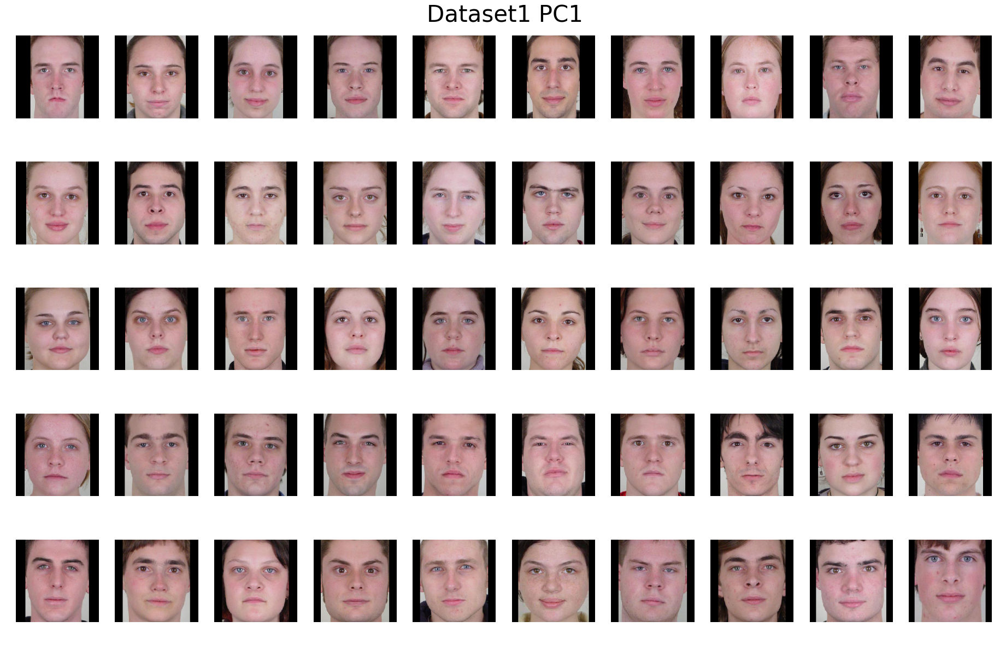

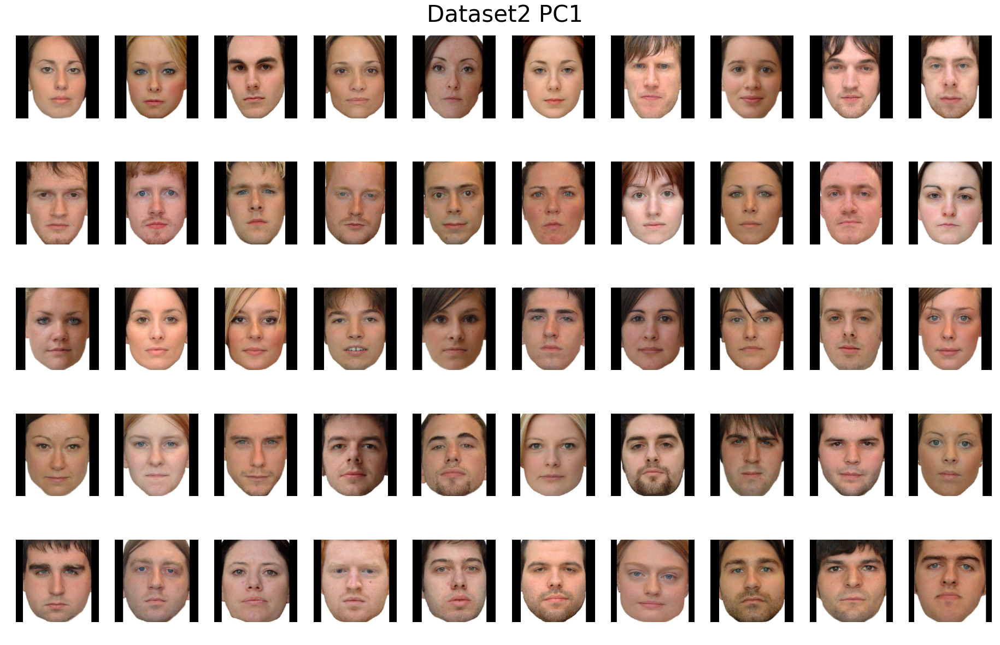

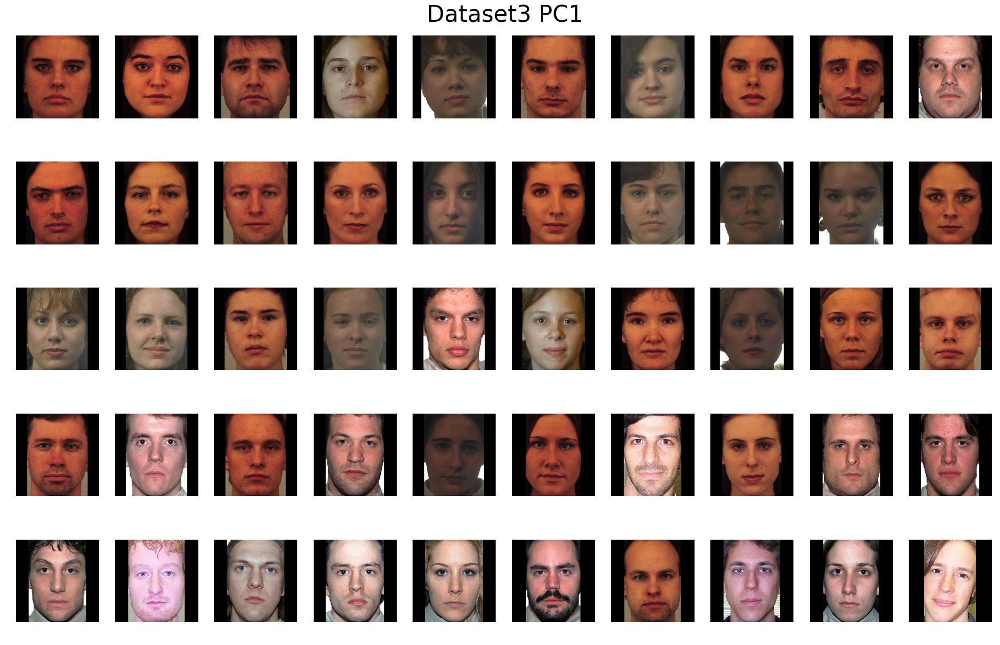

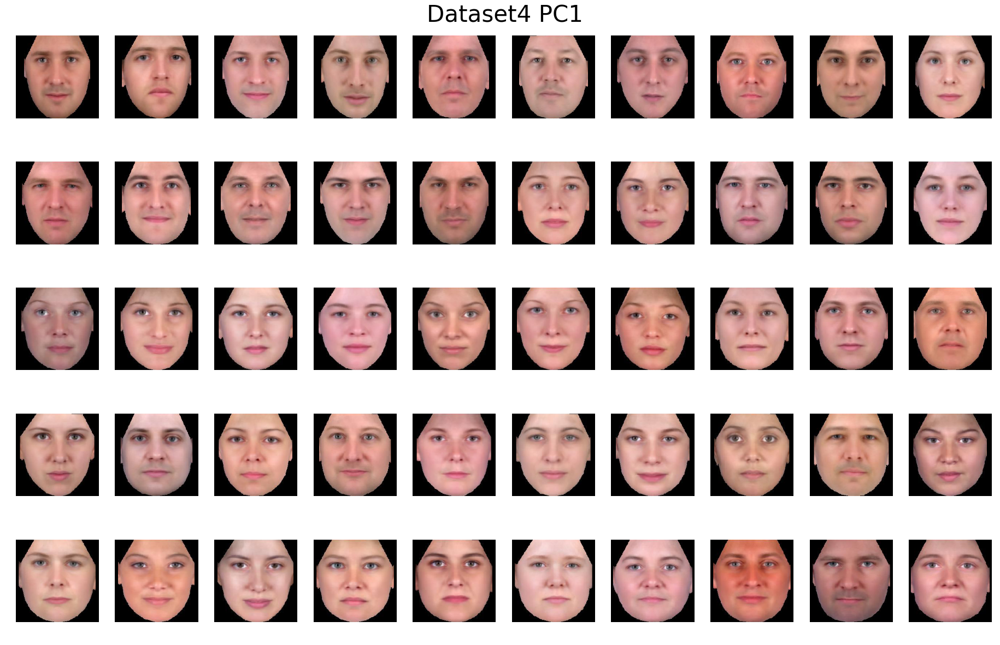

In [139]:
import math
for j in range(0,datasetNum):
    for i in range(0,1): 
        plot_img = img_path_pcaList[j][i]
        f = pylab.figure(figsize = (32,20))
        pylab.title("Dataset"+str(j+1)+" PC"+str(i+1),fontsize = 42)
        plt.axis('off')
        for n, fname in enumerate(plot_img):
            image=Image.open(fname)
            arr=np.asarray(image)
            f.add_subplot(math.floor(float(len(plot_img))/10), 10, n+1)  
            pylab.imshow(arr)
            plt.axis('off')
        pylab.show()
        f.tight_layout()
        #f.savefig(saveFigPath+"/"+MODEL+"_PCA"+str(i+1)+'.jpg', dpi=300)



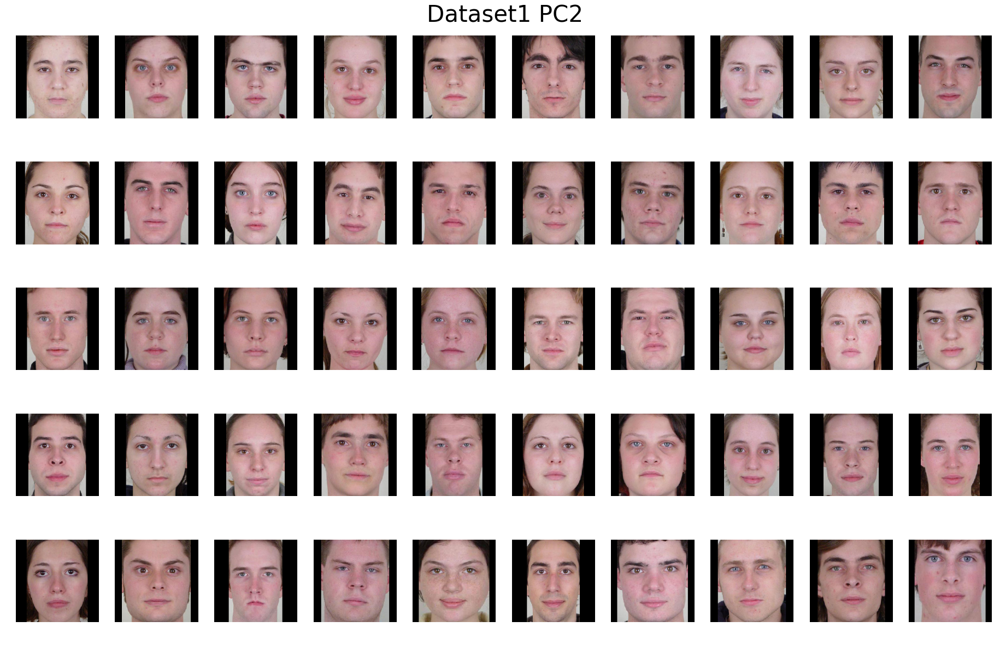

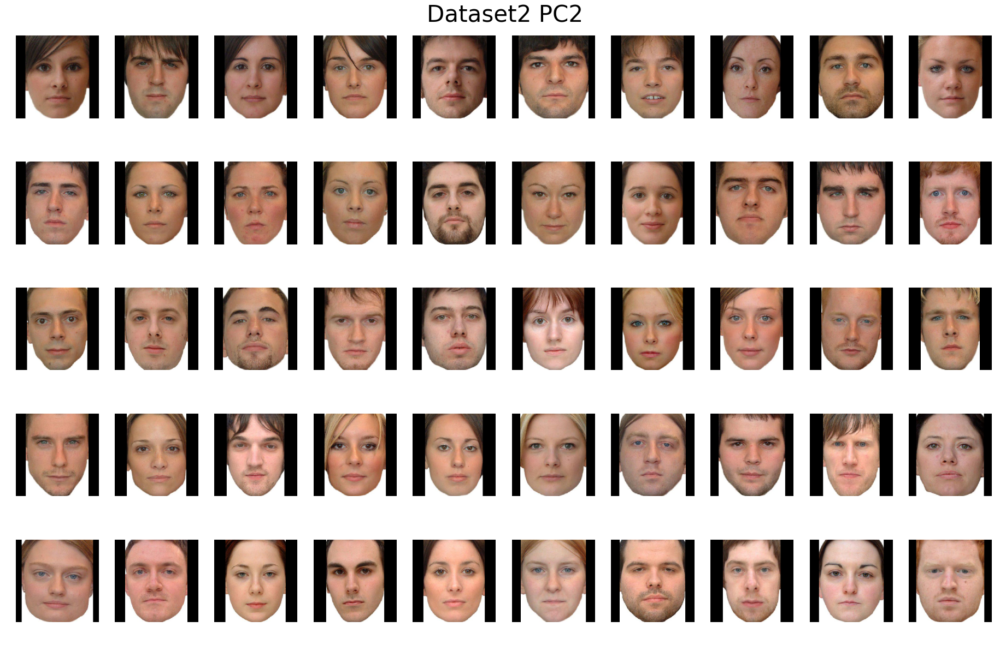

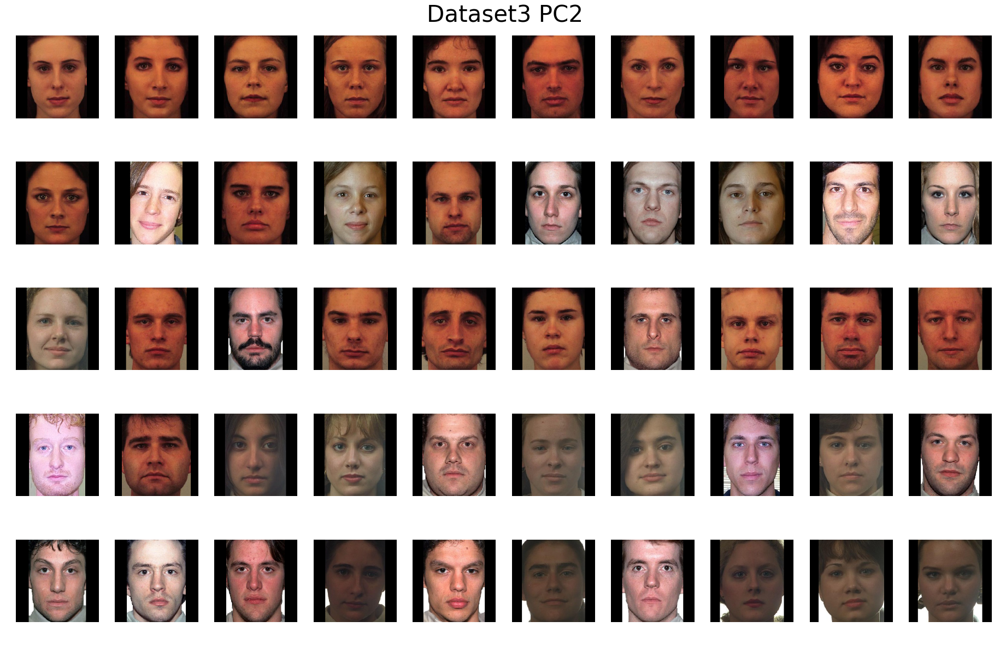

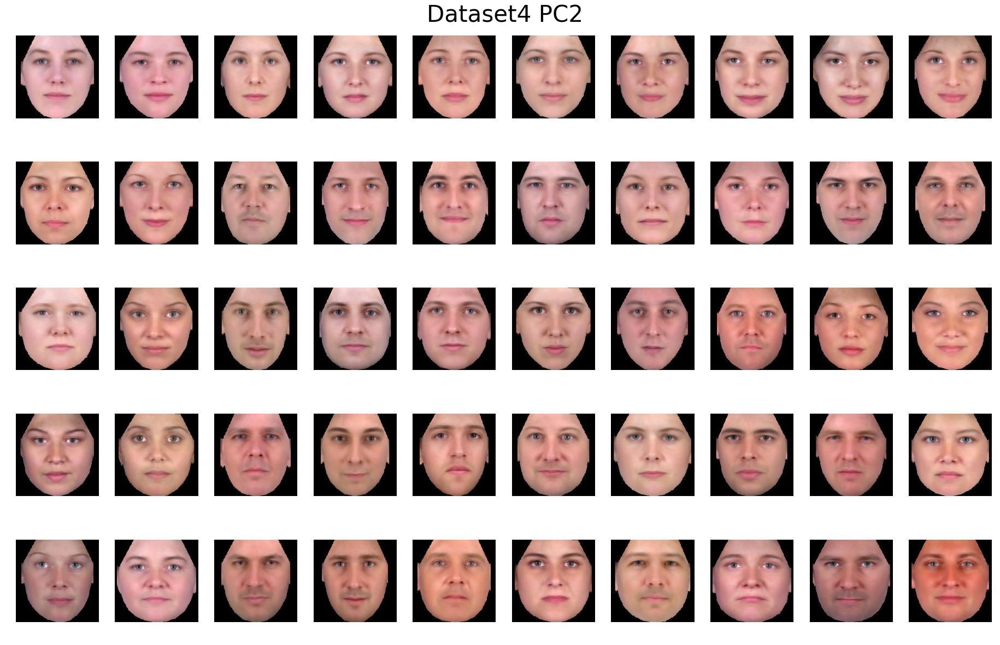

In [138]:
pca_major_feature = [None]*datasetNum
img_path_pca = [None]*datasetNum
img_name_pca = [None]*datasetNum
for j in range(datasetNum):
    pca_major_feature[j],img_path_pca[j],img_name_pca[j]\
    = reOrderPC(pixelsAfterPCA[j],9,imageFilePath[j*50:(j+1)*50],listing[j*50:(j+1)*50] )
#print img_name_pca

for j in range(0,datasetNum):
    for i in range(1,2): 
        plot_img = img_path_pca[j][i]
        f = pylab.figure(figsize = (32,20))
        pylab.title("Dataset"+str(j+1)+" PC"+str(i+1),fontsize = 42)
        plt.axis('off')
        for n, fname in enumerate(plot_img):
            image=Image.open(fname)
            arr=np.asarray(image)
            f.add_subplot(math.floor(float(len(plot_img))/10), 10, n+1)  
            pylab.imshow(arr)
            plt.axis('off')
        pylab.show()
        f.tight_layout()
        #f.savefig(saveFigPath+"/"+MODEL+"_PCA"+str(i+1)+'.jpg', dpi=300)

